# Background

## TO ADD


## Steps:
1. Collecting & Understanding the dataset
2. Loading and pre-processing the images
3. Performing Morphological Operations
4. CNN Model-1 Designing(UNET) & Training the dataset
5. Evaluating the Dataset and Optimizing the model-1 for best reults
6. CNN Model-2 Design (UNET+Alexnet) & training the dataset
7. Evaluating the Dataset and Optimizing the model-2 for best reults
8. Compairing the 2 models and conclusion


## Major Libraries used:
1. **NumPy** is a Python library for numerical computing. It provides support for large, multi-dimensional arrays and matrices, along with mathematical functions to operate on these arrays. NumPy is widely used in fields like machine learning and data analysis.
2. **Pandas** is a Python library for data manipulation and analysis. It provides data structures like DataFrame, which is a two-dimensional table, and Series, which is a one-dimensional labeled array.
3. **Matplotlib** is a Python library for creating static, interactive, and animated visualizations in a wide variety of formats.
4. **Scikit-learn** is a popular machine learning library for Python that provides simple and efficient tools for data analysis and modeling.
5. **TensorFlow** is an open-source machine learning framework developed by the Google Brain team. It is widely used for building and training deep learning models.
6. **Keras** is an open-source high-level neural networks API written in Python. It is widely used for developing and prototyping deep learning models due to its simplicity, flexibility, and integration with TensorFlow. 

#### Load libraries




In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras import backend as keras
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from tensorflow.keras.activations import *

import os
import PIL
## checking for xrays and their respective masks
from glob import glob
import re
from collections import defaultdict
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import tensorflow as tf
from skimage import measure
from sklearn.model_selection import train_test_split

from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras import backend as keras
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from tensorflow.keras.activations import *


# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os

i=0
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        i= i+1
        print(os.path.join(dirname, filename))
        if i>10:
            break;

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


/kaggle/input/chest-xray-masks-and-labels/data/Lung Segmentation/NLM-ChinaCXRSet-ReadMe.docx
/kaggle/input/chest-xray-masks-and-labels/data/Lung Segmentation/NLM-MontgomeryCXRSet-ReadMe.pdf
/kaggle/input/chest-xray-masks-and-labels/data/Lung Segmentation/ClinicalReadings/CHNCXR_0499_1.txt
/kaggle/input/chest-xray-masks-and-labels/data/Lung Segmentation/ClinicalReadings/CHNCXR_0120_0.txt
/kaggle/input/chest-xray-masks-and-labels/data/Lung Segmentation/ClinicalReadings/CHNCXR_0192_0.txt
/kaggle/input/chest-xray-masks-and-labels/data/Lung Segmentation/ClinicalReadings/CHNCXR_0548_1.txt
/kaggle/input/chest-xray-masks-and-labels/data/Lung Segmentation/ClinicalReadings/CHNCXR_0119_0.txt
/kaggle/input/chest-xray-masks-and-labels/data/Lung Segmentation/ClinicalReadings/CHNCXR_0403_1.txt
/kaggle/input/chest-xray-masks-and-labels/data/Lung Segmentation/ClinicalReadings/CHNCXR_0368_1.txt
/kaggle/input/chest-xray-masks-and-labels/data/Lung Segmentation/ClinicalReadings/CHNCXR_0190_0.txt
/kaggle/in

In [2]:
def dice_coef(y_true, y_pred):
    y_true_f = keras.flatten(y_true)
    y_pred_f = keras.flatten(y_pred)
    intersection = keras.sum(y_true_f * y_pred_f)
    return (2. * intersection + 1) / (keras.sum(y_true_f) + keras.sum(y_pred_f) + 1)

def dice_coef_loss(y_true, y_pred):
    return 1-dice_coef(y_true, y_pred)

In [3]:
#Use old model
'''
model = tf.keras.models.load_model("/kaggle/input/optimised-lung-segmentation-using-u-net/my_model3.h5", 
                                     custom_objects={"dice_coef": dice_coef}
                                    )
                                    
model.summary()
'''

'\nmodel = tf.keras.models.load_model("/kaggle/input/optimised-lung-segmentation-using-u-net/my_model3.h5", \n                                     custom_objects={"dice_coef": dice_coef}\n                                    )\n                                    \nmodel.summary()\n'

# Load Dataset

In [4]:
DIR = "/kaggle/input/chest-xray-masks-and-labels/data/"

lung_image_paths = glob(os.path.join(DIR,"Lung Segmentation/CXR_png/*.png"))
mask_image_paths = glob(os.path.join(DIR,"Lung Segmentation/masks/*.png"))

related_paths = defaultdict(list)

for img_path in lung_image_paths:
    img_match = re.search("CXR_png/(.*)\.png$", img_path)
    if img_match:
        img_name = img_match.group(1)
    for mask_path in mask_image_paths:
        mask_match = re.search(img_name, mask_path)
        if mask_match:
            related_paths["image_path"].append(img_path)
            related_paths["mask_path"].append(mask_path)

paths_df = pd.DataFrame.from_dict(related_paths)

In [5]:
paths_df.head(2)

,image_path,mask_path
0,/kaggle/input/chest-xray-masks-and-labels/data...,/kaggle/input/chest-xray-masks-and-labels/data...
1,/kaggle/input/chest-xray-masks-and-labels/data...,/kaggle/input/chest-xray-masks-and-labels/data...


## Performing Morphology & Adding Non-linearity in Images 
### Need-  Non-linearity is crucial for the success of neural networks, especially when dealing with image data. It enhances the expressive power of the network, enables the capture of intricate patterns, facilitates effective training through backpropagation, and helps prevent overfitting. The choice of the specific non-linear activation function can impact the network's performance and training dynamics, and it is often a subject of experimentation in designing effective neural network architectures. 

### What is morphology?
#### In the context of image processing, morphology refers to a set of operations that manipulate the shape or structure of objects within an image. These operations are based on principles from mathematical morphology, a theory rooted in set theory, algebra, and topology. 

# Prepare train and test data

In [6]:
from tqdm import tqdm
import cv2

import cv2
import numpy as np
import random

def random_remove_chunks(image_list, mask_list):
    result_image_list = []
    result_mask_list = []

    for image, mask in zip(image_list, mask_list):
        # Get image dimensions
        height, width = image.shape[:2]

        # Calculate chunk size as a percentage of image dimensions
        chunk_size_pcnt_low = 0.10
        chunk_size_pcnt_high = 0.30
        chunk_size = (20, 20)
        #(random.randint(int(0.10 * height)), random.randint(int(0.10 * width)))
        #random.randint(chunk_size_pcnt * height, chunk_size_pcnt * height)
        
        # Randomly rotate the image and mask
        angle = np.random.uniform(-360, 360)  # Adjust the range of rotation as needed
        rotation_matrix = cv2.getRotationMatrix2D((width / 2, height / 2), angle, 1)
        image = cv2.warpAffine(image, rotation_matrix, (width, height), flags=cv2.INTER_LINEAR)
        mask = cv2.warpAffine(mask, rotation_matrix, (width, height), flags=cv2.INTER_NEAREST)

        # Generate random coordinates for the top-left corner of the chunk
        top_left_x = np.random.randint(0, width - chunk_size[0] + 1)
        top_left_y = np.random.randint(0, height - chunk_size[1] + 1)

        # Remove the chunk from the image
        image_with_removed_chunk = image.copy()
        image_with_removed_chunk[top_left_y:top_left_y + chunk_size[1], top_left_x:top_left_x + chunk_size[0]] = 0

        # Remove the corresponding chunk from the mask
        mask_with_removed_chunk = mask.copy()
        mask_with_removed_chunk[top_left_y:top_left_y + chunk_size[1], top_left_x:top_left_x + chunk_size[0]] = 0

        result_image_list.append(image_with_removed_chunk)
        result_mask_list.append(mask_with_removed_chunk)

    return result_image_list, result_mask_list
  

def prepare_train_test(df = pd.DataFrame(), resize_shape = tuple(), color_mode = "rgb"):
    img_array = list()
    mask_array = list()

    for image_path in tqdm(paths_df.image_path):
        resized_image = cv2.resize(cv2.imread(image_path),resize_shape)
        resized_image = resized_image/255.
        if color_mode == "gray":
            img_array.append(resized_image[:,:,0])
        elif color_mode == "rgb":
            img_array.append(resized_image[:,:,:])
      # img_array.append(resized_image)
  
    for mask_path in tqdm(paths_df.mask_path):
        resized_mask = cv2.resize(cv2.imread(mask_path),resize_shape)
        resized_mask = resized_mask/255.
        mask_array.append(resized_mask[:,:,0])
        # mask_array.append(resized_image)

    img_array, mask_array = random_remove_chunks(img_array, mask_array)   
    return img_array, mask_array

In [7]:
img_side_size = 256

img_array, mask_array = prepare_train_test(df = paths_df, resize_shape = (256,256), color_mode = "gray")
img_train, img_test, mask_train, mask_test = train_test_split(img_array, mask_array, test_size = 0.2, random_state= 42)
img_train = np.array(img_train).reshape(len(img_train), img_side_size, img_side_size)
img_test = np.array(img_test).reshape(len(img_test), img_side_size, img_side_size)
mask_train = np.array(mask_train).reshape(len(mask_train), img_side_size, img_side_size)
mask_test = np.array(mask_test).reshape(len(mask_test), img_side_size, img_side_size)

100%|██████████| 704/704 [00:50<00:00, 13.82it/s]


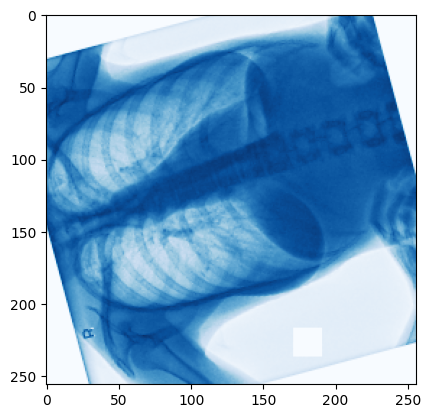

In [8]:
img_num=2
plt.imshow(img_test[img_num].reshape(img_side_size, img_side_size), cmap = "Blues")

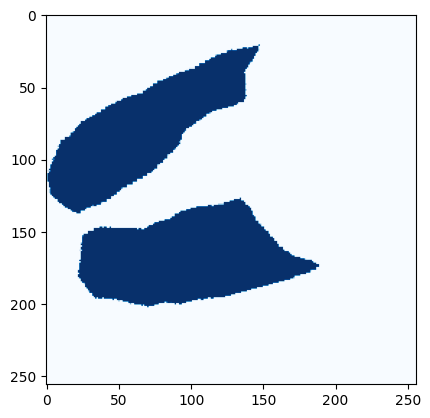

In [9]:
plt.imshow(mask_test[img_num].reshape(img_side_size, img_side_size), cmap = "Blues")

In [10]:
def add_noise(image, noise_type='gaussian'):
    row, col = image.shape
    mean = 0
    var = 0.1
    sigma = var ** 0.5
    gauss = np.random.normal(mean, sigma, (row, col))
    noisy = image + gauss
    #np.clip(noisy, 0, 255).astype(np.uint8)
    return noisy  #np.clip(noisy, 0, 255).astype(np.uint8)

In [11]:
#s = add_noise(img_test[0])
#y = s + img_test[0]

def test_on_image(model, img_array, img_num, img_side_size = 256):
    
    pred = model.predict(img_array[img_num].reshape(1,img_side_size,img_side_size,1))
    pred[pred>0.5] = 1.0
    pred[pred<0.5] = 0.0
    fig = plt.figure(figsize = (15,10))
    
    plt.subplot(1,4,1)
    plt.imshow(pred.reshape(img_side_size, img_side_size), cmap = "Blues")
    plt.title("Predicted")
    plt.axis("off")
    
    plt.subplot(1,4,2)
    plt.imshow(mask_test[img_num].reshape(img_side_size, img_side_size), cmap = "Blues")
    plt.title("Mask");
    plt.axis("off")
    
    plt.subplot(1,4,3)
    plt.imshow(mask_test[img_num].reshape(img_side_size, img_side_size), cmap = "Blues", alpha = 0.5)
    plt.imshow(pred.reshape(img_side_size, img_side_size),cmap = "PuBu", alpha = 0.3)
    plt.title("Overlay")
    plt.axis("off")
    
    plt.subplot(1,4,4)
    plt.imshow(img_array[img_num].reshape(img_side_size, img_side_size), cmap = "gray")
    plt.title("Original")
    plt.axis("off")
    
    return pred


def test_on_image_noise(model, img_array, img_num, img_side_size = 256):
    
    img_noise = add_noise(img_array[img_num]) #+ img_array[img_num]
    pred = model.predict(img_noise.reshape(1,img_side_size,img_side_size,1))
    pred[pred>0.5] = 1.0
    pred[pred<0.5] = 0.0
    
    fig = plt.figure(figsize = (15,10))
    
    if img_num<=10:

        plt.subplot(1,4,1)
        plt.imshow(pred.reshape(img_side_size, img_side_size), cmap = "Blues")
        plt.title("Predicted")
        plt.axis("off")

        plt.subplot(1,4,2)
        plt.imshow(mask_test[img_num].reshape(img_side_size, img_side_size), cmap = "Blues")
        plt.title("Mask");
        plt.axis("off")

        plt.subplot(1,4,3)
        plt.imshow(img_array[img_num].reshape(img_side_size, img_side_size), cmap = "Blues")
        plt.title("Original")
        plt.axis("off")

        plt.subplot(1,4,4)
        plt.imshow(img_noise.reshape(img_side_size, img_side_size), cmap = "Blues")
        plt.title("Noise")
        plt.axis("off")
    
    return pred


def dice_coef_test(y_true, y_pred):
    
    y_true_f = y_true.flatten()
    y_pred_f = y_pred.flatten()
    union = np.sum(y_true_f) + np.sum(y_pred_f)
    if union==0: return 1
    intersection = np.sum(y_true_f * y_pred_f)
    
    return 2. * intersection / union

#### The Dice coefficient is often used to assess the accuracy of a segmentation algorithm by comparing the overlap between the predicted and ground truth segmentations

(-0.5, 255.5, 255.5, -0.5)

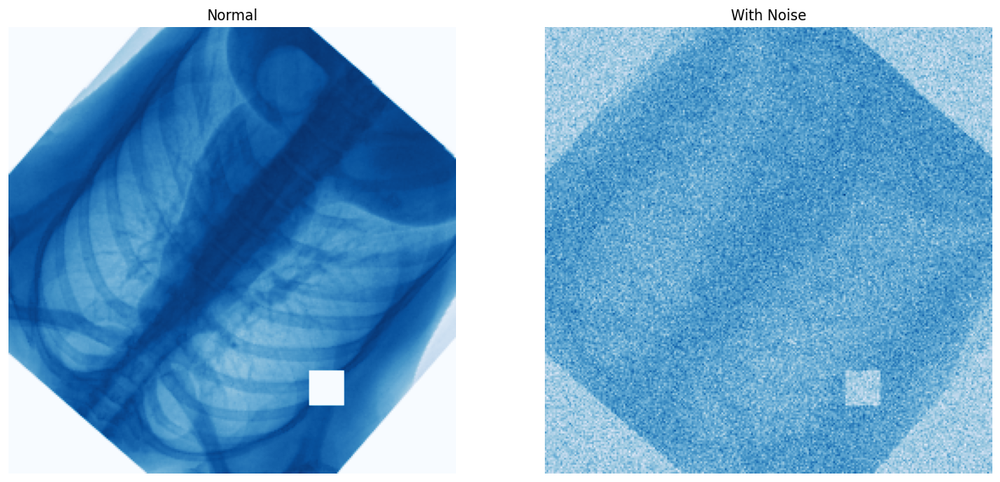

In [12]:
#SEE IN THE TEST DATA NOISE ADDED

num=3
fig = plt.figure(figsize = (15,10))
    
plt.subplot(1,2,1)
plt.imshow(img_train[num], cmap = "Blues")
plt.title("Normal")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(add_noise(img_train[num]) , cmap = "Blues")
plt.title("With Noise")
plt.axis("off")

# What Is Semantic Segmentation?

### Semantic segmentation is a computer vision task where the goal is to classify each pixel in an image into specific categories or classes. It provides a detailed understanding of the image at a pixel level, assigning labels to different objects or regions in the scene
### This is useful in applications like autonomous vehicles, medical image analysis, and object recognition. Convolutional Neural Networks (CNNs) are commonly used for semantic segmentation tasks.


.

# What Is UNET?

### U-Net is a convolutional neural network (CNN) architecture designed for semantic segmentation tasks, where the goal is to classify each pixel in an image into specific categories. It was developed with a focus on biomedical image segmentation but has since found applications in various computer vision domains.

1. **Contracting Path (Encoder)**: The initial layers of U-Net perform convolutional operations coupled with downsampling to capture hierarchical features and reduce spatial dimensions. Convolutional operations are crucial for feature extraction, and downsampling helps create a condensed representation of the input.

2. **Expansive Path (Decoder)**: The decoder part of U-Net is responsible for upsampling the condensed representation obtained from the contracting path to recover the spatial information. Skip connections are established between corresponding layers in the contracting and expansive paths, enabling the network to retain fine-grained details during upsampling.

3. **Skip Connections**: Skip connections facilitate the fusion of low-level features from the contracting path with high-level features from the expansive path. This architectural choice mitigates the information loss associated with downsampling and aids in preserving spatial context for accurate segmentation.

4. **Final Result**: The final layer typically employs a softmax activation function to produce pixel-wise predictions, effectively delineating objects and their boundaries. U-Net excels in generating detailed segmentation masks, making it suitable for tasks demanding precise object localization.

5. **Loss Function**: Commonly, cross-entropy loss is used as the objective function for training U-Net. This is particularly relevant for segmentation tasks where pixel-wise classification is required.

#### It was introduced by Olaf Ronneberger, Philipp Fischer, and Thomas Brox in the paper titled "U-Net: Convolutional Networks for Biomedical Image Segmentation."ation is required.

#### UNet

In [13]:
def unet(input_size=(256,256,1)):
    inputs = Input(input_size)
    
    conv1 = Conv2D(32, (3, 3), activation='tanh', padding='same')(inputs)
    conv1 = Conv2D(32, (3, 3), activation='elu', padding='same')(conv1)
    
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(64, (3, 3), activation='elu', padding='same')(pool1)
    conv2 = Conv2D(64, (3, 3), activation='elu', padding='same')(conv2)
    
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(128, (3, 3), activation='elu', padding='same')(pool2)
    conv3 = Conv2D(128, (3, 3), activation='elu', padding='same')(conv3)
   
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(256, (3, 3), activation='elu', padding='same')(pool3)
    conv4 = Conv2D(256, (3, 3), activation='elu', padding='same')(conv4)
    
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    conv5 = Conv2D(512, (3, 3), activation='elu', padding='same')(pool4)
    conv5 = Conv2D(512, (3, 3), activation='elu', padding='same')(conv5)

    up6 = concatenate([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv5), conv4], axis=3)
    conv6 = Conv2D(256, (3, 3), activation='elu', padding='same')(up6)
    conv6 = Conv2D(256, (3, 3), activation='elu', padding='same')(conv6)

    up7 = concatenate([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv6), conv3], axis=3)
    conv7 = Conv2D(128, (3, 3), activation='elu', padding='same')(up7)
    conv7 = Conv2D(128, (3, 3), activation='elu', padding='same')(conv7)

    up8 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv7), conv2], axis=3)
    conv8 = Conv2D(64, (3, 3), activation='elu', padding='same')(up8)
    conv8 = Conv2D(64, (3, 3), activation='elu', padding='same')(conv8)

    up9 = concatenate([Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(conv8), conv1], axis=3)
    conv9 = Conv2D(32, (3, 3), activation='elu', padding='same')(up9)
    conv9 = Conv2D(32, (3, 3), activation='elu', padding='same')(conv9)

    conv10 = Conv2D(1, (1, 1), activation='sigmoid')(conv9)

    return Model(inputs=[inputs], outputs=[conv10])

In [14]:
EPOCHS = 30
model = unet(input_size=(256,256,1))
model.compile(optimizer=Adam(lr=5*1e-4), loss="binary_crossentropy", \
                  metrics=[dice_coef, 'binary_accuracy'])
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 256, 256, 32)         320       ['input_1[0][0]']             
                                                                                                  
 conv2d_1 (Conv2D)           (None, 256, 256, 32)         9248      ['conv2d[0][0]']              
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 128, 128, 32)         0         ['conv2d_1[0][0]']            
 D)                                                                                           

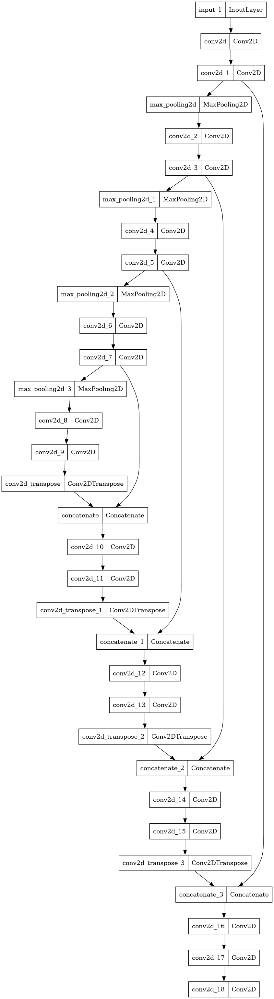

In [15]:
tf.keras.utils.plot_model(model, to_file='unet_model.png')

In [16]:
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau
weight_path="{}_unet2_weights.best.hdf5".format('cxr_reg')

checkpoint = ModelCheckpoint(weight_path, monitor='loss', #verbose=1, 
                             save_best_only=True, #mode='min', 
                             save_weights_only = True)


early = EarlyStopping(monitor="loss", 
                      #mode="min", 
                      patience=10) # probably needs to be more patient, but kaggle time is limited
callbacks_list = [checkpoint, early]

#earlystopping = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=10)

history = model.fit(x = img_train, 
                    y = mask_train, 
                    validation_data = (img_test, mask_test), 
                    epochs = 100, 
                    batch_size = 16,
                   callbacks = callbacks_list)
model.save('unet2.h5')

Epoch 1/100
36/36 [==============================] - 26s 236ms/step - loss: 0.6138 - dice_coef: 0.2727 - binary_accuracy: 0.7035 - val_loss: 0.5337 - val_dice_coef: 0.2979 - val_binary_accuracy: 0.7463
Epoch 2/100
36/36 [==============================] - 5s 149ms/step - loss: 0.5249 - dice_coef: 0.3286 - binary_accuracy: 0.7297 - val_loss: 0.4944 - val_dice_coef: 0.5044 - val_binary_accuracy: 0.7375
Epoch 3/100
36/36 [==============================] - 5s 149ms/step - loss: 0.3088 - dice_coef: 0.6054 - binary_accuracy: 0.8706 - val_loss: 0.2503 - val_dice_coef: 0.6922 - val_binary_accuracy: 0.8967
Epoch 4/100
36/36 [==============================] - 5s 148ms/step - loss: 0.2255 - dice_coef: 0.7312 - binary_accuracy: 0.9131 - val_loss: 0.2058 - val_dice_coef: 0.7452 - val_binary_accuracy: 0.9220
Epoch 5/100
36/36 [==============================] - 5s 149ms/step - loss: 0.1980 - dice_coef: 0.7612 - binary_accuracy: 0.9248 - val_loss: 0.3291 - val_dice_coef: 0.6611 - val_binary_accuracy: 0

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


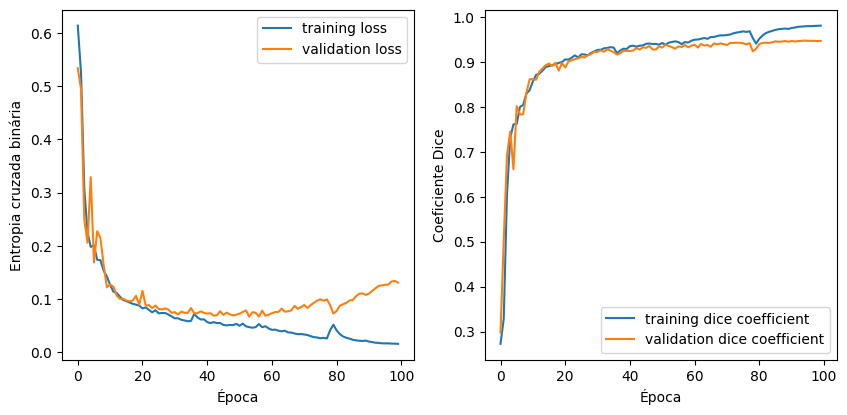

In [17]:
def get_metrics(history):
    fig = plt.figure(figsize = (10,10))
    plt.subplot(2,2,1)
    plt.plot(history.history["loss"], label = "training loss")
    plt.plot(history.history["val_loss"], label = "validation loss")
    plt.legend()
    plt.xlabel("Época")
    plt.ylabel("Entropia cruzada binária")

    plt.subplot(2,2,2)
    plt.plot(history.history["dice_coef"], label = "training dice coefficient")
    plt.plot(history.history["val_dice_coef"], label = "validation dice coefficient")
    plt.legend()
    plt.xlabel("Época")
    plt.ylabel("Coeficiente Dice")
    
get_metrics(history = history)

1/1 [==============================] - 1s 607ms/step


0.9136644349007655

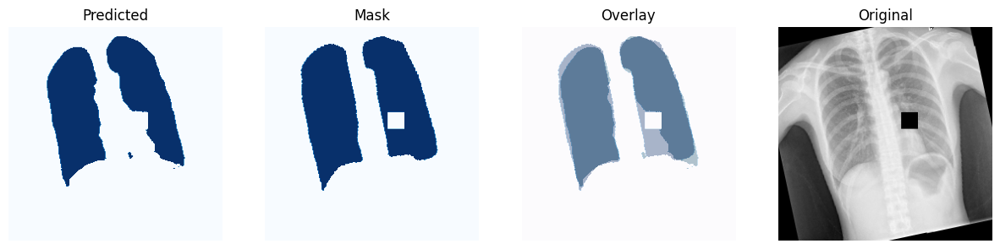

In [18]:
IMG_NUM = 3 #Melhor img_num 12 (0.98) Pior img_num 10 (0.9)
prediction = test_on_image(model, img_array = img_test, img_num = IMG_NUM, img_side_size = 256)
dice_coef_test(y_true = mask_test[IMG_NUM], y_pred = prediction)

1/1 [==============================] - 0s 20ms/step


0.7760058487807179

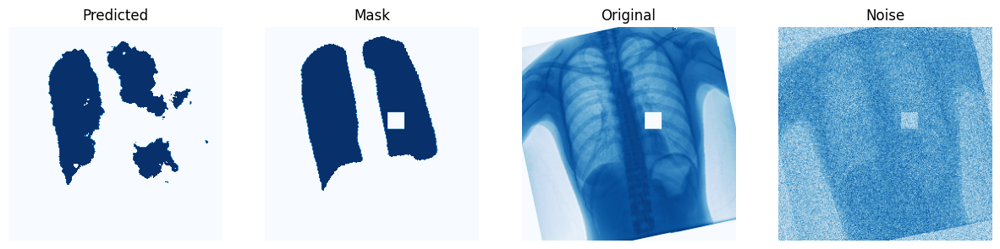

In [19]:
IMG_NUM = 3 #Melhor img_num 12 (0.98) Pior img_num 10 (0.9)
prediction = test_on_image_noise(model, img_array = img_test, img_num = IMG_NUM, img_side_size = 256)
dice_coef_test(y_true = mask_test[IMG_NUM], y_pred = prediction)

1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_27/3172264969.py:42: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize = (15,10))


1/1 [==============================] - 0s 28ms/step


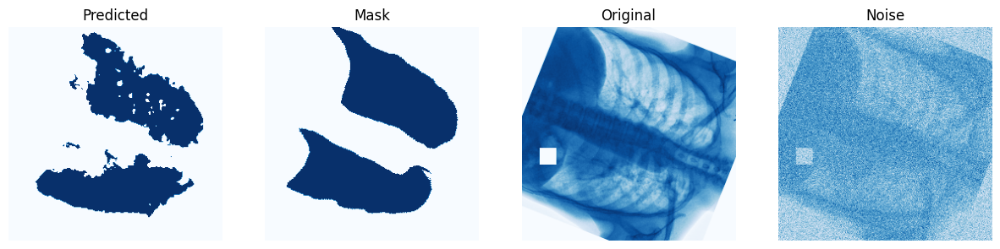

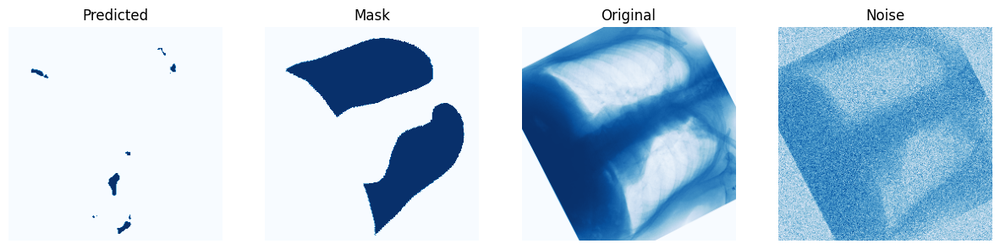

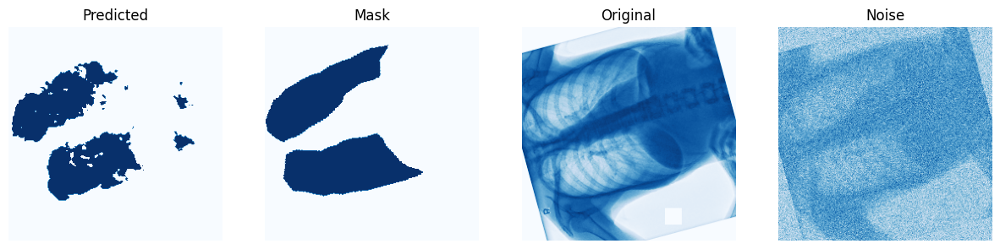

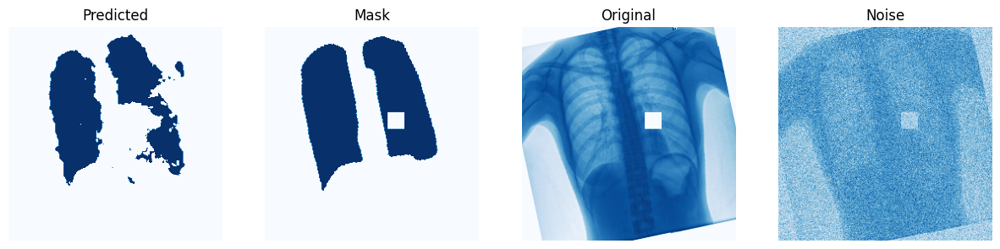

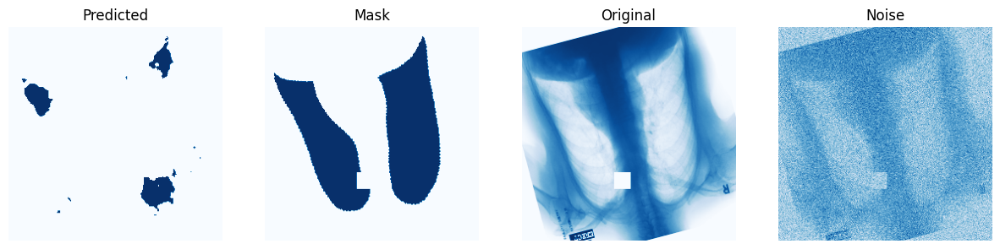

...

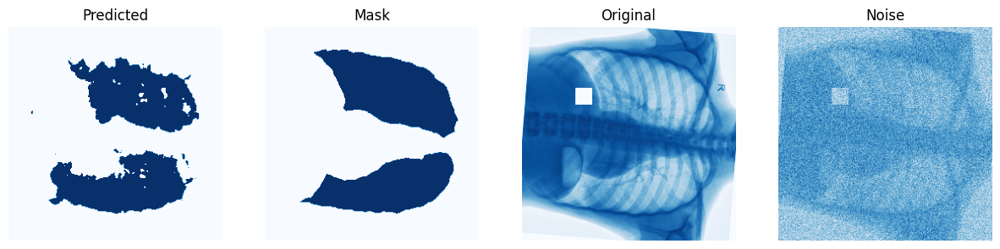

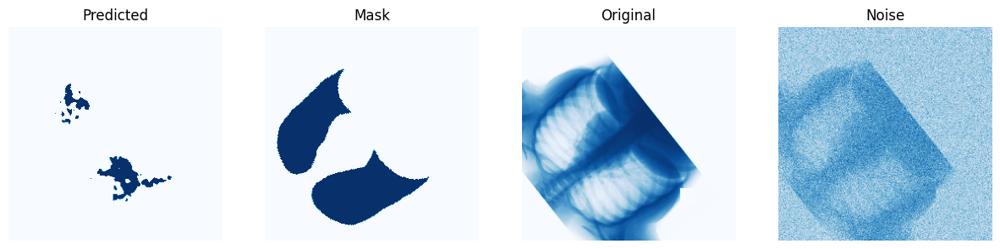

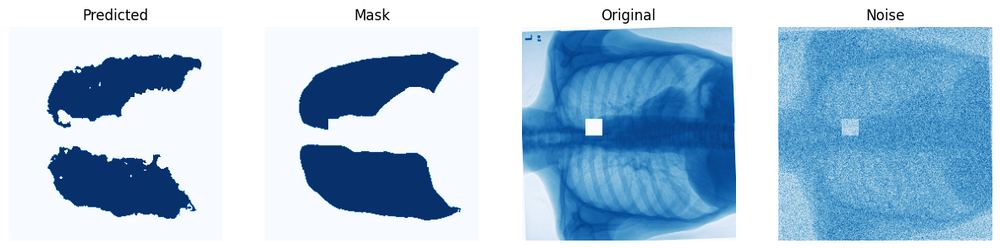

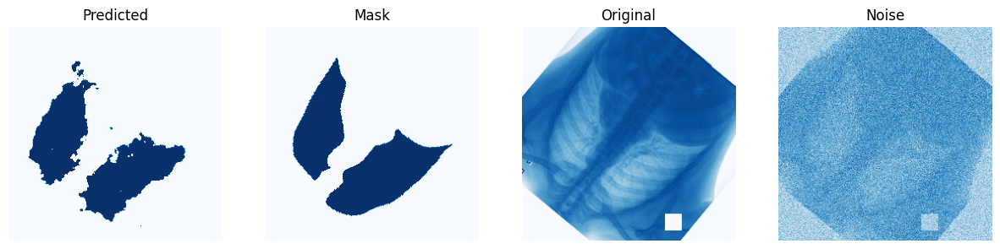

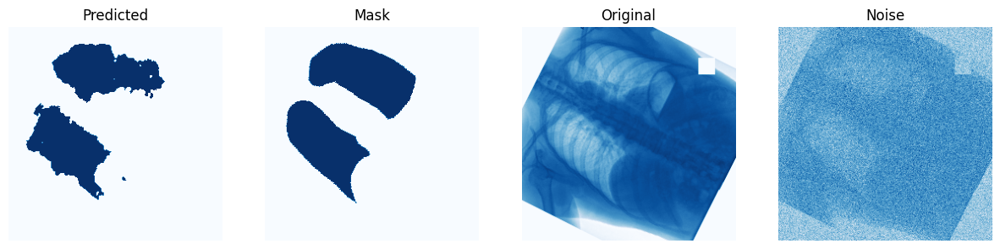

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

In [20]:
dice_list = []
for i in range(0, len(img_test)):
    prediction = test_on_image_noise(model, img_array = img_test, img_num = i, img_side_size = 256)
    x = dice_coef_test(y_true = mask_test[i], y_pred = prediction)
    dice_list.append(x)

In [21]:
'''
dice_list = []
for i in range(0, len(img_test)):
    prediction = test_on_image_noise(model, img_array = img_test, img_num = i, img_side_size = 256)
    x = dice_coef_test(y_true = mask_test[i], y_pred = prediction)
    dice_list.append(x)
'''

'\ndice_list = []\nfor i in range(0, len(img_test)):\n    prediction = test_on_image_noise(model, img_array = img_test, img_num = i, img_side_size = 256)\n    x = dice_coef_test(y_true = mask_test[i], y_pred = prediction)\n    dice_list.append(x)\n'

In [22]:
#prediction.shape

In [23]:
np.mean(dice_list), np.median(dice_list)

(0.7113577599448991, 0.8476384706142033)

# AlexNet

### AlexNet is a convolutional neural network (CNN) architecture that gained significant attention and marked a breakthrough in the field of computer vision and deep learning. It was designed by Alex Krizhevsky, Ilya Sutskever, and Geoffrey Hinton and won the ImageNet Large Scale Visual Recognition Challenge (ILSVRC) in 2012.

### AlexNet consists of eight layers in total, including five convolutional layers and three fully connected layers. 
The architecture includes a combination of convolutional layers, max-pooling layers, and fully connected layers.

In [24]:
def dice_coef(y_true, y_pred):
    y_true_f = keras.flatten(y_true)
    y_pred_f = keras.flatten(y_pred)
    intersection = keras.sum(y_true_f * y_pred_f)
    return (2. * intersection + 1) / (keras.sum(y_true_f) + keras.sum(y_pred_f) + 1)

def dice_coef_loss(y_true, y_pred):
    return 1-dice_coef(y_true, y_pred)

def unet_alex(input_size=(256,256,1)):
    inputs = Input(input_size)
    
    conv1 = Conv2D(32, (3, 3), activation='tanh', padding='same')(inputs)
    conv1 = Conv2D(32, (3, 3), activation='elu', padding='same')(conv1)
    
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    ac1 = Conv2D(filters=96,kernel_size=(11,11), strides=(4,4), activation='elu', kernel_initializer='he_normal', padding='same') (conv1)
    ap1 = MaxPooling2D(pool_size=(2, 2), strides=(2,2)) (ac1)
    ac2 = Conv2D(filters=256,kernel_size=(5,5), strides=(2,2), activation='elu', kernel_initializer='he_normal', padding='same') (ap1)
    ap2 = MaxPooling2D(pool_size=(2, 2), strides=(2,2)) (ac2)
    ac3 = Conv2D(filters=384,kernel_size=(3,3), strides=(2,2), activation='elu', kernel_initializer='he_normal', padding='same') (ap2)
    ac4 = Conv2D(filters=384,kernel_size=(3,3), strides=(2,2), activation='elu', kernel_initializer='he_normal', padding='same') (ac3)
    ac5 = Conv2D(filters=256,kernel_size=(3,3), strides=(1,1), activation='elu', kernel_initializer='he_normal', padding='same') (ac4)
    ac5 = Dropout(0.1) (ac5)
    ap3 = MaxPooling2D(pool_size=(2, 2), strides=(2,2)) (ac5)
    af1=Flatten()(ap3)
    aD1= Dense(units=2048,activation='elu')(af1)
    aD2= Dense(units=2048,activation='relu')(aD1)
    aD2 = Dropout(0.2) (aD2)
    aD3= Dense(units=1000,activation='relu')(aD2)
    aoutput = Dense(units=1,activation='sigmoid')(aD3)

    conv2 = Conv2D(64, (3, 3), activation='elu', padding='same')(pool1)
    conv2 = Conv2D(64, (3, 3), activation='elu', padding='same')(conv2)
    
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(128, (3, 3), activation='elu', padding='same')(pool2)
    conv3 = Conv2D(128, (3, 3), activation='elu', padding='same')(conv3)
   
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(256, (3, 3), activation='elu', padding='same')(pool3)
    conv4 = Conv2D(256, (3, 3), activation='elu', padding='same')(conv4)
    
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    conv5 = Conv2D(512, (3, 3), activation='elu', padding='same')(pool4)
    conv5 = Conv2D(512, (3, 3), activation='elu', padding='same')(conv5)

    up6 = concatenate([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv5), conv4], axis=3)
    conv6 = Conv2D(256, (3, 3), activation='elu', padding='same')(up6)
    conv6 = Conv2D(256, (3, 3), activation='elu', padding='same')(conv6)

    up7 = concatenate([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv6), conv3], axis=3)
    conv7 = Conv2D(128, (3, 3), activation='elu', padding='same')(up7)
    conv7 = Conv2D(128, (3, 3), activation='elu', padding='same')(conv7)

    up8 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv7), conv2], axis=3)
    conv8 = Conv2D(64, (3, 3), activation='elu', padding='same')(up8)
    conv8 = Conv2D(64, (3, 3), activation='elu', padding='same')(conv8)

    up9 = concatenate([Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(conv8), conv1], axis=3)
    up9 = Add()([up9, aoutput])
    conv9 = Conv2D(32, (3, 3), activation='elu', padding='same')(up9)
    conv9 = Conv2D(32, (3, 3), activation='elu', padding='same')(conv9)

    conv10 = Conv2D(1, (1, 1), activation='sigmoid')(conv9)

    return Model(inputs=[inputs], outputs=[conv10])

In [25]:
EPOCHS = 30
model_x = unet_alex(input_size=(256,256,1))
model_x.compile(optimizer=Adam(lr=0.0001), loss="binary_crossentropy", \
                  metrics=[dice_coef, 'binary_accuracy'])
model_x.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 conv2d_19 (Conv2D)          (None, 256, 256, 32)         320       ['input_2[0][0]']             
                                                                                                  
 conv2d_20 (Conv2D)          (None, 256, 256, 32)         9248      ['conv2d_19[0][0]']           
                                                                                                  
 max_pooling2d_4 (MaxPoolin  (None, 128, 128, 32)         0         ['conv2d_20[0][0]']           
 g2D)                                                                                       

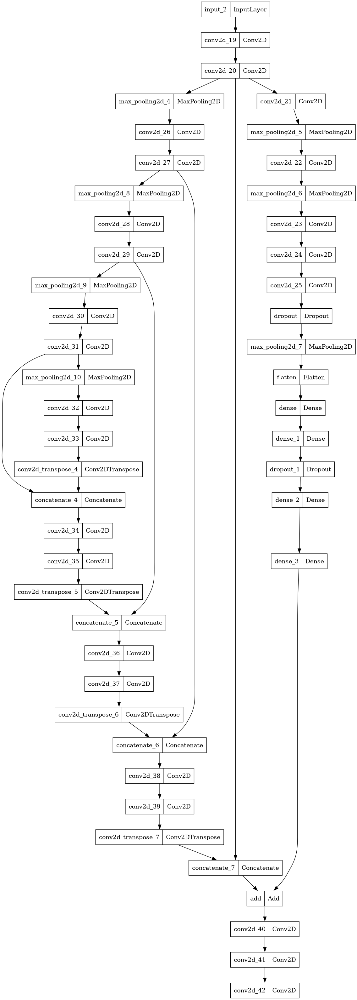

In [26]:
tf.keras.utils.plot_model(model_x, to_file='model2.png')

In [27]:
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau
weight_path="{}_unet_alex_weights.best.hdf5".format('cxr_reg')

checkpoint = ModelCheckpoint(weight_path, monitor='loss', #verbose=1, 
                             save_best_only=True, #mode='min', 
                             save_weights_only = True)


early = EarlyStopping(monitor="loss", 
                      #mode="min", 
                      patience=10) # probably needs to be more patient, but kaggle time is limited
callbacks_list = [checkpoint, early]

In [28]:
#earlystopping = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=10)

history2 = model_x.fit(x = img_train, 
                    y = mask_train, 
                    validation_data = (img_test, mask_test), 
                    epochs = 100, 
                    batch_size = 16,
                   callbacks = callbacks_list)
model_x.save('unet_alex.h5')

Epoch 1/100


2023-12-22 22:49:00.683775: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_1/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


36/36 [==============================] - 21s 265ms/step - loss: 0.5920 - dice_coef: 0.2724 - binary_accuracy: 0.7141 - val_loss: 0.5687 - val_dice_coef: 0.2473 - val_binary_accuracy: 0.7484
Epoch 2/100
36/36 [==============================] - 8s 235ms/step - loss: 0.5676 - dice_coef: 0.2850 - binary_accuracy: 0.7305 - val_loss: 0.6413 - val_dice_coef: 0.2325 - val_binary_accuracy: 0.7019
Epoch 3/100
36/36 [==============================] - 8s 235ms/step - loss: 0.4164 - dice_coef: 0.4534 - binary_accuracy: 0.8014 - val_loss: 0.3846 - val_dice_coef: 0.5711 - val_binary_accuracy: 0.8616
Epoch 4/100
36/36 [==============================] - 8s 235ms/step - loss: 0.4006 - dice_coef: 0.4876 - binary_accuracy: 0.8217 - val_loss: 0.3238 - val_dice_coef: 0.5609 - val_binary_accuracy: 0.8753
Epoch 5/100
36/36 [==============================] - 8s 235ms/step - loss: 0.2702 - dice_coef: 0.6610 - binary_accuracy: 0.8919 - val_loss: 0.2483 - val_dice_coef: 0.7066 - val_binary_accuracy: 0.9092
Epoch 

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1/1 [==============================] - 0s 415ms/step


0.908136734478788

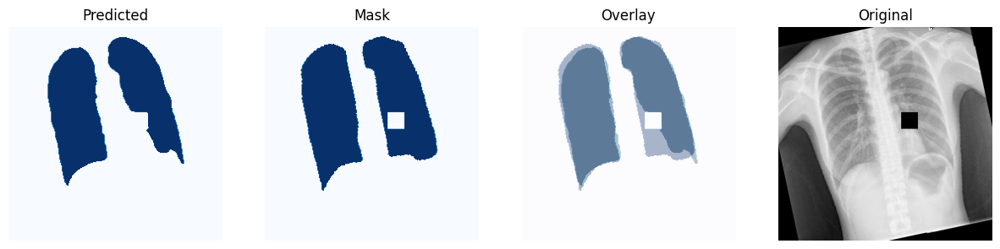

In [29]:
import random

seed = 42
random.seed = seed
np.random.seed = seed


def testx_on_image(model, img_array, img_num, img_side_size = 256):
    
    pred = model_x.predict(img_array[img_num].reshape(1,img_side_size,img_side_size,1))
    pred[pred>0.5] = 1.0
    pred[pred<0.5] = 0.0
    fig = plt.figure(figsize = (15,10))
    
    plt.subplot(1,4,1)
    plt.imshow(pred.reshape(img_side_size, img_side_size), cmap = "Blues")
    plt.title("Predicted")
    plt.axis("off")
    
    plt.subplot(1,4,2)
    plt.imshow(mask_test[img_num].reshape(img_side_size, img_side_size), cmap = "Blues")
    plt.title("Mask");
    plt.axis("off")
    
    plt.subplot(1,4,3)
    plt.imshow(mask_test[img_num].reshape(img_side_size, img_side_size), cmap = "Blues", alpha = 0.5)
    plt.imshow(pred.reshape(img_side_size, img_side_size),cmap = "PuBu", alpha = 0.3)
    plt.title("Overlay")
    plt.axis("off")
    
    plt.subplot(1,4,4)
    plt.imshow(img_array[img_num].reshape(img_side_size, img_side_size), cmap = "gray")
    plt.title("Original")
    plt.axis("off")
    
    return pred

def dice_coef_test(y_true, y_pred):
    y_true_f = y_true.flatten()
    y_pred_f = y_pred.flatten()
    union = np.sum(y_true_f) + np.sum(y_pred_f)
    if union==0: return 1
    intersection = np.sum(y_true_f * y_pred_f)
    return 2. * intersection / union

IMG_NUM = 3 #Melhor img_num 12 (0.98) Pior img_num 10 (0.9)
prediction = testx_on_image(model_x, img_array = img_test, img_num = IMG_NUM, img_side_size = 256)
dice_coef_test(y_true = mask_test[IMG_NUM], y_pred = prediction)

1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_27/3172264969.py:42: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize = (15,10))


1/1 [==============================] - 0s 19ms/step


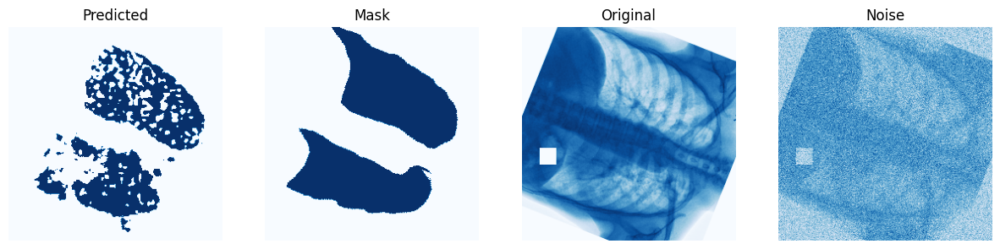

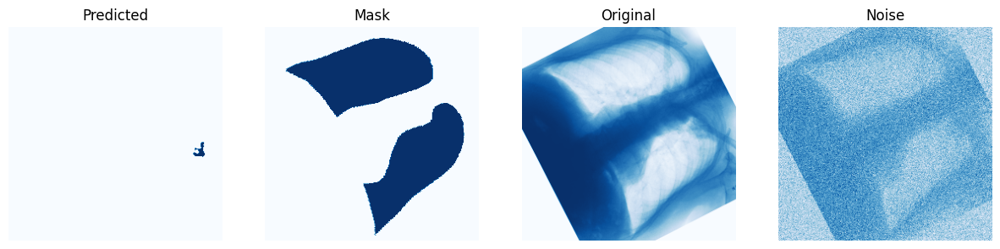

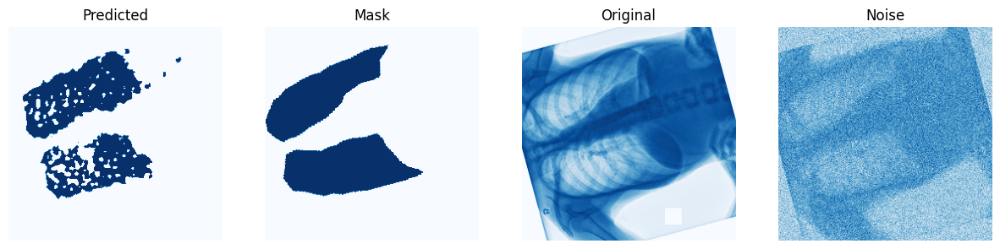

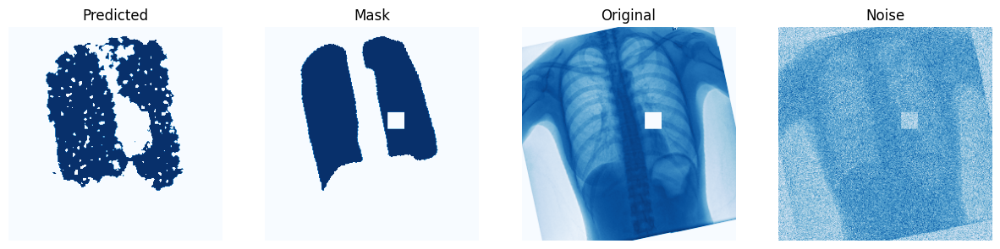

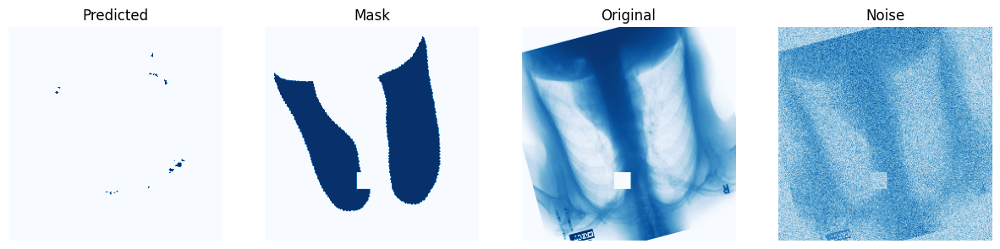

...

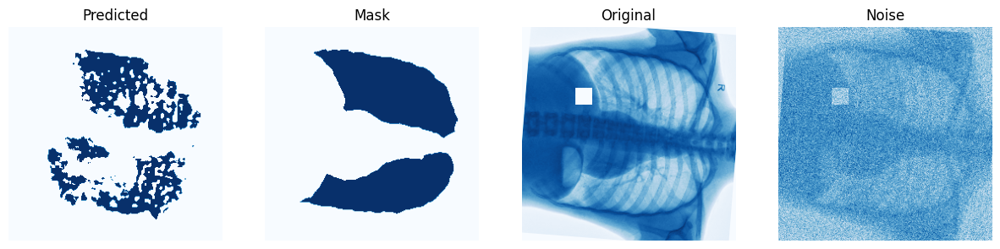

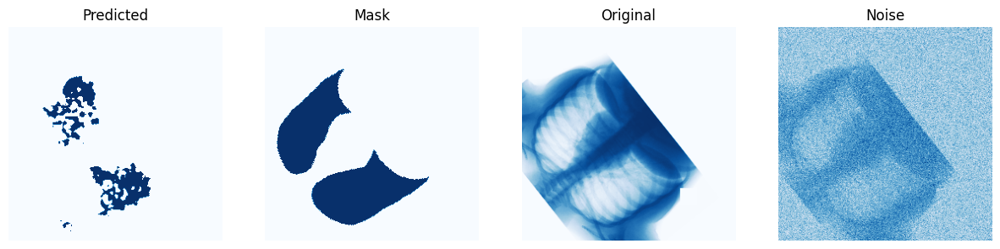

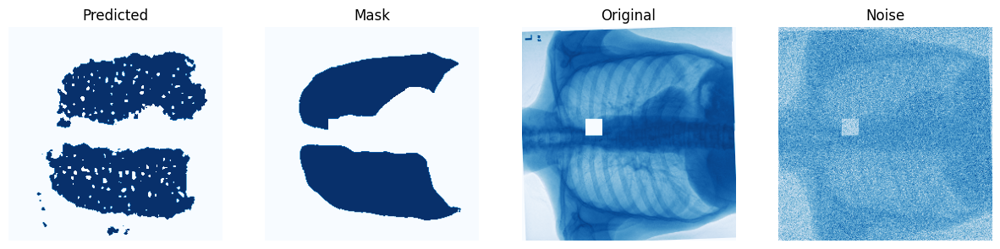

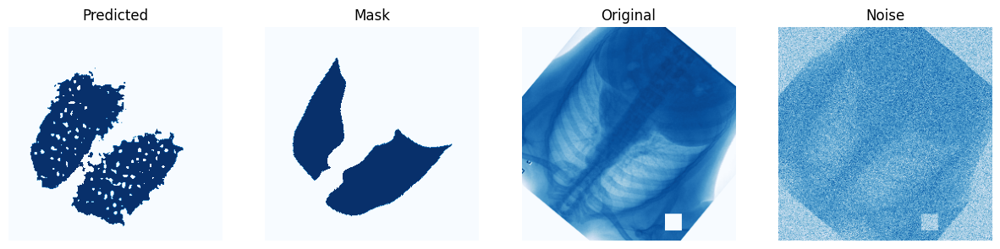

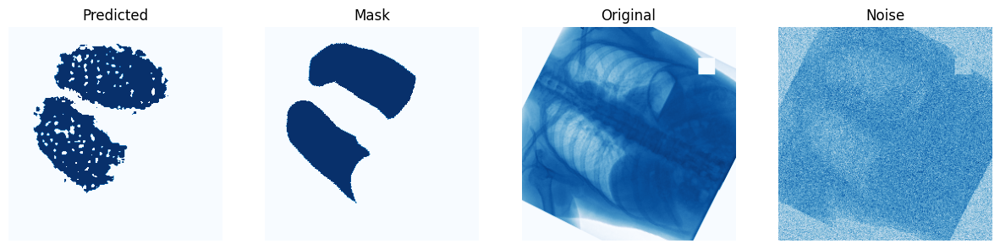

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

In [30]:
dice_list_2 = []
for i in range(0, len(img_test)):
    prediction = test_on_image_noise(model_x, img_array = img_test, img_num = i, img_side_size = 256)
    x = dice_coef_test(y_true = mask_test[i], y_pred = prediction)
    dice_list_2.append(x)

In [31]:
np.mean(dice_list_2), np.median(dice_list_2)

(0.6183385700381776, 0.7374276748739435)